In [5]:
from load import load_all_sis_data
import numpy as np

# Load all data
all_flux_data, datetime_values, element_mapping = load_all_sis_data('flux_1998/')

print("All data shape:", all_flux_data.shape)
print("Element Mapping:", element_mapping, "\n")

# Precompute the Q1 values for each element
energy_level_to_compute = 1
q1_values = {}
for element_name, element_index in element_mapping.items():
    valid_data_mask = (all_flux_data[energy_level_to_compute - 1, :, element_index] != -999.9) & (all_flux_data[energy_level_to_compute - 1, :, element_index] != 0)
    element_flux_for_stats = all_flux_data[energy_level_to_compute - 1, :, element_index][valid_data_mask]
    if len(element_flux_for_stats) > 0:
        q1_values[element_name] = np.percentile(element_flux_for_stats, 25)


All data shape: (8, 231864, 6)
Element Mapping: {'C': 0, 'Fe': 1, 'He': 2, 'N': 3, 'O': 4, 'Si': 5} 



---
**Code below is work in progress**

This code also classifies decay events into 'Exponential Decay,' 'Power-Law Decay,' and 'Irregular Decay,' but uses a sliding window approach instead of predefined segments. 

The window size is half of the data length, and the code iterates through the data, analyzing different overlapping windows. For each window, it performs linear regression on log-transformed flux data and calculates the R-values. 

The code identifies the window with the best-fitting R-value and stores the exact start and end times of that window. The decay type classification is based on these best R-values, and the results are stored in the dataframe along with the specific window times that provided the best fit.









In [6]:
import numpy as np
import pandas as pd
from scipy.stats import linregress

def classify_decay_events(decay_events_df, data_3d, datetime_values, element_mapping, energy_level):
    def log_transform_y(flux, time):
        # Filter out zero or negative values to avoid log10 issues
        valid_mask = flux > 0
        valid_flux = flux[valid_mask]
        valid_time = time[valid_mask]
        
        if len(valid_flux) == 0:
            return None, None  # If no valid data after filtering, return None
        
        log_flux = np.log10(valid_flux)
        return valid_time, log_flux

    def log_transform_xy(flux, time):
        valid_mask = flux > 0
        valid_flux = flux[valid_mask]
        valid_time = time[valid_mask]

        if len(valid_flux) == 0:
            return None, None  # If no valid data after filtering, return None

        log_flux = np.log10(valid_flux)
        time_numeric = np.array([(t - pd.Timestamp("1970-01-01")).total_seconds() for t in valid_time])
        log_time = np.log10((time_numeric - time_numeric[0]) / 3600 + 1)  # Shift to avoid zero time differences
        return log_time, log_flux

    def fit_linear_model(x, y):
        if x is None or y is None or len(x) == 0 or len(y) == 0:
            return 0, 0, 0, 1, 0  # Return zero slope and non-significant p-value for invalid data

        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        if slope > 0:
            r_value = 0  # Ignore positive slopes by setting R-value to 0
        return slope, intercept, r_value, p_value, std_err

    def classify_decay(log_y_r_value, log_log_r_value):
        if abs(log_y_r_value) < 0.965 and abs(log_log_r_value) < 0.965:
            return 'Irregular Decay'
        elif abs(log_y_r_value) > abs(log_log_r_value):
            return 'Exponential Decay'
        else:
            return 'Power-Law Decay'

    classifications = []
    best_log_y_r_values = []
    best_log_log_r_values = []
    best_log_y_window_times = []
    best_log_log_window_times = []

    for index, row in decay_events_df.iterrows():
        start_time = pd.Timestamp(row['Start Year'], 1, 1) + pd.Timedelta(days=row['Start Fractional Day'] - 1) + pd.Timedelta(hours=row['Start Hour'])
        end_time = pd.Timestamp(row['End Year'], 1, 1) + pd.Timedelta(days=row['End Fractional Day'] - 1) + pd.Timedelta(hours=row['End Hour'])
        time_mask = (datetime_values >= start_time) & (datetime_values <= end_time)

        he_flux = data_3d[energy_level - 1, time_mask, element_mapping['He']]
        he_time = datetime_values[time_mask]

        valid_data_mask = he_flux != -999.9
        he_flux = he_flux[valid_data_mask]
        he_time = he_time[valid_data_mask]

        if len(he_flux) == 0:
            classifications.append('No Valid Data')
            best_log_y_r_values.append(np.nan)
            best_log_log_r_values.append(np.nan)
            best_log_y_window_times.append(('N/A', 'N/A'))
            best_log_log_window_times.append(('N/A', 'N/A'))
            continue

        window_size = int(0.66 * (len(he_flux))) # shorten window
        best_log_y_r_value = 0
        best_log_log_r_value = 0
        best_log_y_window_times_current = (None, None)
        best_log_log_window_times_current = (None, None)

        for i in range(len(he_flux) - window_size + 1):
            flux_window = he_flux[i:i + window_size]
            time_window = he_time[i:i + window_size]

            # Log-transform y-axis
            time_log_y, flux_log_y = log_transform_y(flux_window, time_window)
            if time_log_y is not None and flux_log_y is not None:
                _, _, r_value_log_y, _, _ = fit_linear_model(np.arange(len(flux_log_y)), flux_log_y)

                if abs(r_value_log_y) > abs(best_log_y_r_value):
                    best_log_y_r_value = r_value_log_y
                    best_log_y_window_times_current = (time_window[0], time_window[-1])

            # Log-transform x and y axes
            time_log_log, flux_log_log = log_transform_xy(flux_window, time_window)
            if time_log_log is not None and flux_log_log is not None:
                _, _, r_value_log_log, _, _ = fit_linear_model(time_log_log, flux_log_log)

                if abs(r_value_log_log) > abs(best_log_log_r_value):
                    best_log_log_r_value = r_value_log_log
                    best_log_log_window_times_current = (time_window[0], time_window[-1])

        classification = classify_decay(best_log_y_r_value, best_log_log_r_value)
        classifications.append(classification)
        best_log_y_r_values.append(best_log_y_r_value)
        best_log_log_r_values.append(best_log_log_r_value)
        best_log_y_window_times.append(best_log_y_window_times_current)
        best_log_log_window_times.append(best_log_log_window_times_current)

    decay_events_df['Decay Type'] = classifications
    decay_events_df['Best Log-Y R-value'] = best_log_y_r_values
    decay_events_df['Best Log-Log R-value'] = best_log_log_r_values
    decay_events_df['Best Log-Y Window Times'] = best_log_y_window_times
    decay_events_df['Best Log-Log Window Times'] = best_log_log_window_times
    return decay_events_df



filtered_df = pd.read_csv("transformed_data/true_decay_1998.csv")          #for only events with 3 or more elements decaying
# filtered_df = pd.read_csv("transformed_data/uncleaned_decay_events_98.csv")  #for all events, rougly 500+

classified_decay_events_df = classify_decay_events(filtered_df, all_flux_data, datetime_values, element_mapping, energy_level_to_compute)

print(classified_decay_events_df)
# classified_decay_events_df.to_csv('transformed_data/classified_decay_events_98_min3.csv', index=False)
# classified_decay_events_df.to_csv('transformed_data/classified_decay_events_98.csv', index=False)


     Event Number  Start Year  End Year  Start Fractional Day  \
0               1        1998      1998            111.583333   
1               2        1998      1998            119.416655   
2               3        1998      1998            126.166655   
3               4        1998      1998            128.791667   
4               5        1998      1998            167.583322   
..            ...         ...       ...                   ...   
216           217        2024      2024             74.880914   
217           218        2024      2024             81.944896   
218           219        2024      2024            130.769468   
219           220        2024      2024            133.885926   
220           221        2024      2024            159.648681   

     End Fractional Day  Start Hour   End Hour  Elements Decaying  \
0            118.624988   14.000000  14.999722                  6   
1            126.291655    9.999722   6.999722                  6   
2           

In [11]:
import pandas as pd

# Read the CSV file

df = classified_decay_events_df #use if not reading from file

# df = pd.read_csv("transformed_data/classified_decay_events_98_min3.csv")

# Create new dataframes based on Decay Type
exponential_decay_df = df[df['Decay Type'] == 'Exponential Decay']
irregular_decay_df = df[df['Decay Type'] == 'Irregular Decay']
power_law_decay_df = df[df['Decay Type'] == 'Power-Law Decay']

# power_law_decay_df.to_csv('transformed_data/power_law_decay_df.csv', index=False)

# Reindex the dataframes
exponential_decay_df = exponential_decay_df.reset_index(drop=True)
irregular_decay_df = irregular_decay_df.reset_index(drop=True)
power_law_decay_df = power_law_decay_df.reset_index(drop=True)

# Count the number of events in each decay type
exponential_decay_count = len(exponential_decay_df)
irregular_decay_count = len(irregular_decay_df)
power_law_decay_count = len(power_law_decay_df)

# Print the counts
print("Exponential Decay Count:", exponential_decay_count)
print("Irregular Decay Count:", irregular_decay_count)
print("Power-Law Decay Count:", power_law_decay_count)

Exponential Decay Count: 125
Irregular Decay Count: 85
Power-Law Decay Count: 11


Graph of flux events using data from energy level 1 and using data from Helium at energy level 1 for cutoffs


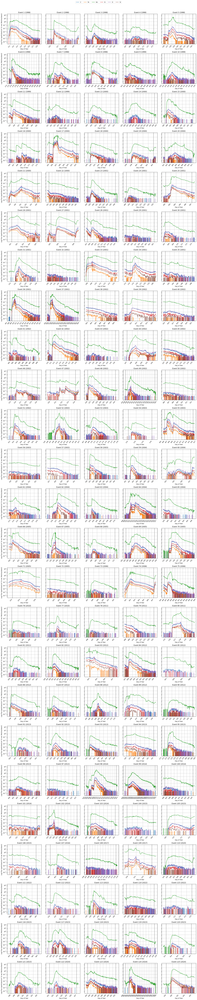

In [13]:
# Plot filtered events
from graph import plot_all_decay_events

energy_level_to_plot = 1
extend_days = 0.5

print(f"Graph of flux events using data from energy level {energy_level_to_plot} and using data from Helium at energy level {energy_level_to_plot} for cutoffs")
plot_all_decay_events(exponential_decay_df, all_flux_data, datetime_values, element_mapping, energy_level_to_plot, extend_days, True)

---
Modified graphing functions below with attempts to fit lines.


C:\Users\jeffr\AppData\Local\Temp\ipykernel_11520\1594962636.py:62: RuntimeWarning: divide by zero encountered in log10
  log_flux = np.log10(fit_flux)
C:\Users\jeffr\AppData\Local\Temp\ipykernel_11520\1594962636.py:68: RuntimeWarning: divide by zero encountered in log10
  log_flux = np.log10(fit_flux)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


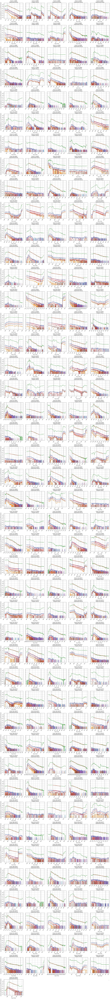

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

def plot_classified_decay_events(decay_events_df, data_3d, datetime_values, element_mapping, energy_level, extend_days):
    num_events = len(decay_events_df)
    if num_events == 0:
        print("No decay events found to plot.")
        return

    num_cols = 5
    num_rows = int(np.ceil(num_events / num_cols))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows), sharey=True)
    fig.subplots_adjust(hspace=0.5, top=0.95)

    for i, row in decay_events_df.iterrows():
        ax = axes[i // num_cols, i % num_cols]

        # Use best start and stop times for plotting
        best_log_y_window_times = row['Best Log-Y Window Times']
        best_log_log_window_times = row['Best Log-Log Window Times']

        if row['Decay Type'] == 'Exponential Decay':
            best_start_time, best_end_time = best_log_y_window_times
        else:
            best_start_time, best_end_time = best_log_log_window_times

        if pd.isnull(best_start_time) or pd.isnull(best_end_time):
            # No valid data for this event
            ax.text(0.5, 0.5, 'No Valid Data', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
            ax.axis('off')
            continue

        best_start_time = pd.to_datetime(best_start_time)
        best_end_time = pd.to_datetime(best_end_time)

        # Extend time window for context
        extended_start_time = best_start_time - pd.Timedelta(days=extend_days)
        extended_end_time = best_end_time + pd.Timedelta(days=extend_days)

        time_mask = (datetime_values >= extended_start_time) & (datetime_values <= extended_end_time)

        for element, index in element_mapping.items():
            element_flux = data_3d[energy_level - 1, time_mask, index]
            element_time = datetime_values[time_mask]

            valid_data_mask = element_flux != -999.9
            element_flux = element_flux[valid_data_mask]
            element_time = element_time[valid_data_mask]

            ax.plot(element_time, element_flux, label=element)

            # Plot best fit line within the best window
            fit_mask = (element_time >= best_start_time) & (element_time <= best_end_time)
            fit_time = element_time[fit_mask]
            fit_flux = element_flux[fit_mask]

            if len(fit_time) > 1:  # Ensure there's enough data for fitting
                if row['Decay Type'] == 'Exponential Decay':
                    log_flux = np.log10(fit_flux)
                    coeffs = np.polyfit(mdates.date2num(fit_time), log_flux, 1)
                    poly = np.poly1d(coeffs)
                    ax.plot(fit_time, 10**poly(mdates.date2num(fit_time)), color='red', linestyle='--', linewidth=2, label=f'Best Fit ({element})')
                elif row['Decay Type'] == 'Power-Law Decay':
                    log_time = np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)
                    log_flux = np.log10(fit_flux)
                    coeffs = np.polyfit(log_time, log_flux, 1)
                    poly = np.poly1d(coeffs)
                    ax.plot(fit_time, 10**poly(np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)), 
                            color='red', linestyle='--', linewidth=2, label=f'Best Fit ({element})')


        ax.set_yscale("log")
        ax.set_xlabel("Day of Year")

        if i % num_cols == 0:
            ax.set_ylabel("Log Flux (particles/(cm² Sr sec MeV/nucleon))")
        ax.set_title(f"Event {i+1} ({best_start_time.year})\n{row['Decay Type']}")
        ax.grid(True)

        ax.xaxis.set_major_locator(mdates.DayLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%j"))
        ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=12))
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

        ax.axvline(best_start_time, color="black", linestyle="--", linewidth=1)
        ax.axvline(best_end_time, color="black", linestyle="--", linewidth=1)

    # Hide any unused subplots in the grid
    for j in range(i+1, num_rows * num_cols):
        axes[j // num_cols, j % num_cols].axis('off')

    plt.tight_layout()
    plt.legend()
    plt.show()

plot_classified_decay_events(classified_decay_events_df, all_flux_data, datetime_values, element_mapping, energy_level_to_compute, extend_days=1)


In [10]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import numpy as np
# import pandas as pd

# def plot_decay_events_per_element(decay_events_df, data_3d, datetime_values, element_mapping, energy_levels, extend_days, useLogScale):
#     """
#     Args:
#         decay_events_df (pd.DataFrame): DataFrame containing decay event details.
#         data_3d (numpy.ndarray): The 3D data cube (energy, time, element).
#         datetime_values (numpy.ndarray): Array of datetime objects for the time axis.
#         element_mapping (dict): Dictionary mapping element names to array indices.
#         energy_levels (int): Number of energy levels to analyze (starting from the lowest).
#         extend_days (int): Number of days to extend the time range before and after the event.
#         useLogScale (bool): Whether to use a logarithmic scale for the y-axis.
#     """
    
#     for idx, row in decay_events_df.iterrows():
#         event_number = row["Event Number"]
        
#         start_time = pd.to_datetime(f"{int(row['Start Year'])}-{row['Start Fractional Day']:.5f}", format="%Y-%j.%f")
#         end_time = pd.to_datetime(f"{int(row['End Year'])}-{row['End Fractional Day']:.5f}", format="%Y-%j.%f")

#         extended_start_time = start_time - pd.Timedelta(days=extend_days)
#         extended_end_time = end_time + pd.Timedelta(days=extend_days)
        
#         time_mask = (datetime_values >= extended_start_time) & (datetime_values <= extended_end_time)
        
#         num_elements = len(element_mapping)
#         num_cols = 3
#         num_rows = int(np.ceil(num_elements / num_cols))
        
#         fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows), sharey=True)
#         fig.subplots_adjust(hspace=0.5, top=0.95)
#         axes = axes.flatten()

#         for i, (element_name, element_index) in enumerate(element_mapping.items()):

#             # if element_name != 'He':
#             #     continue
#             ax = axes[i]
            
#             for level in range(energy_levels):
#                 element_flux = data_3d[level, time_mask, element_index]
#                 valid_data_mask = element_flux != -999.9
#                 element_flux = element_flux[valid_data_mask]
#                 element_time = datetime_values[time_mask][valid_data_mask]
                
#                 line, = ax.plot(element_time, element_flux, label=f"Energy Level {level+1}")
                
#                 # Plot best fit line within the best window
#                 best_log_y_window_times = row['Best Log-Y Window Times']
#                 best_log_log_window_times = row['Best Log-Log Window Times']

#                 if row['Decay Type'] == 'Exponential Decay':
#                     best_start_time, best_end_time = best_log_y_window_times
#                 else:
#                     best_start_time, best_end_time = best_log_log_window_times

#                 if pd.isnull(best_start_time) or pd.isnull(best_end_time):
#                     continue

#                 best_start_time = pd.to_datetime(best_start_time)
#                 best_end_time = pd.to_datetime(best_end_time)

#                 fit_mask = (element_time >= best_start_time) & (element_time <= best_end_time)
#                 fit_time = element_time[fit_mask]
#                 fit_flux = element_flux[fit_mask]

#                 if len(fit_time) > 1:  # Ensure there's enough data for fitting
#                     if row['Decay Type'] == 'Exponential Decay':
#                         log_flux = np.log10(fit_flux)
#                         coeffs = np.polyfit(mdates.date2num(fit_time), log_flux, 1)
#                         poly = np.poly1d(coeffs)
#                         ax.plot(fit_time, 10**poly(mdates.date2num(fit_time)), color='black', linestyle='--', linewidth=2, label=f'Best Fit (Level {level+1})')
#                     elif row['Decay Type'] == 'Power-Law Decay':
#                         log_time = np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)
#                         log_flux = np.log10(fit_flux)
#                         coeffs = np.polyfit(log_time, log_flux, 1)
#                         poly = np.poly1d(coeffs)
#                         ax.plot(fit_time, 10**poly(np.log10((mdates.date2num(fit_time) - mdates.date2num(fit_time)[0]) / 3600 + 1)), color='black', linestyle='--', linewidth=2, label=f'Best Fit (Level {level+1})')

#             if useLogScale:
#                 ax.set_yscale("log")
            
#             ax.set_xlabel("Day of Year")
#             ax.set_ylabel("Log Flux" if useLogScale else "Flux")
#             ax.set_title(f"{element_name}")
#             ax.grid(True)

#             ax.xaxis.set_major_locator(mdates.DayLocator())
#             ax.xaxis.set_major_formatter(mdates.DateFormatter("%j"))
#             ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=12))
#             plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
#             ax.axvline(start_time, color="black", linestyle="--", linewidth=1)
#             ax.axvline(end_time, color="black", linestyle="--", linewidth=1)
        
#         for j in range(i + 1, num_rows * num_cols):
#             axes[j].axis('off')
        
#         # Add the legend inside the first subplot
#         handles, labels = [], []
#         for ax in axes[:num_elements]:
#             for handle, label in zip(*ax.get_legend_handles_labels()):
#                 if label not in labels:
#                     handles.append(handle)
#                     labels.append(label)
#         axes[0].legend(handles, labels, loc='upper right', bbox_to_anchor=(1, 1))
        
#         fig.suptitle(f"Decay Event {event_number} ({start_time.year})", fontsize=16)
#         plt.tight_layout()
#         plt.show()

# plot_decay_events_per_element(classified_decay_events_df, all_flux_data, datetime_values, element_mapping, energy_levels=5, extend_days=1, useLogScale=True)
